<font size=5><b>**Школа Тинькоф. Анализ данных в индустрии 2023 (вольные слушатели)**</b></font>
    
<font size=4><b>**Логистическая регрессия и случайный лес**</b></font>

# Задачи

В задании вам предстоит на простом примере познакомиться с базовыми инструментами построения логистической регрессии:
* визуализация
* разбиение данных на обучающую и тестовую выборки
* преобразование переменных
* отбор переменных
* $L1$ и $L2$ регуляризации
* построение итоговой модели и валидация

Далее вы построите случайный лес и сравните два класса моделей.

Все это будет на сгенерированных данных.

## Задание 1

Написать функцию woe_line, которая:

1. разбивает наблюдения на n_buckets групп по $X$;
2. выводит график, по оси *y* которого - WoE, а по оси *x* - медианное значение $X$;
4. рассчитывает ROC AUC признака;
5. рассчитывает доверительный интервал для bad rate (bad rate - доля наблюдений с целевой переменной = 1 от всех наблюдений в группе);
6. выводит график линейного приближения любым способом.

## Задание 2

1. Проверить каждую переменную на woe_line.
2. Каждую полезную переменную линеаризовать (для каждой переменной нужны графики ДО и ПОСЛЕ).
3. Ненужные переменные (слабые по ROC AUC, немонотонные) исключить из модели.
4. На отобранных и линеаризованных переменных построить модель логистической регрессии, проверить результат на test по ROC AUC.

## Задание 3

Обучить две модели случайного леса:

 - на всех признаках из изначального датасета (на сырых данных)
 - на признаках, на которых вы строили логрег (после удаления неинформативных признаков и линеаризации остальных)

Подобрать гиперпараметры на отделенной от трейна валидационной выборке.

## Задание 4

В функции генерации датасета указано $n\_redundant=2$. Это значит, что две переменные получены линейной комбинацией информативных переменных.

Предыдущий анализ никак не исключает появления всех переменных в модели, для этого можно воспользоваться методами отбора признаков.

1. Подобрать коэффициент $L1$-регуляризации на валидационной выборке, убрать лишние переменные из модели и повысить таким образом ее стабильность.

2. Подобрать коэффициент $L2$-регуляризации, чтобы избежать слишком больших коэффициентов и улучшить качество на val, test. На этом шаге использовать только те переменные, которые отобраны после п.1

# Генерация данных

Сперва загрузим все необходимые бибилиотеки

In [1]:
# автоформатирование Jupyter lab
try:
    %load_ext lab_black
except:
    None

In [2]:
import numpy as np
import pandas as pd

from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import roc_auc_score, r2_score
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.ensemble import RandomForestClassifier

from scipy import stats

import seaborn as sns

import matplotlib.pyplot as plt

plt.style.use("ggplot")
# sns.set_theme(style="darkgrid")

In [3]:
try:
    import optuna
except Exception:
    ! pip install optuna
    import optuna

In [4]:
try:
    import phik
except Exception:
    ! pip install phik
    import phik

Создадим массивы с заданными параметрами и разобъем их на train и test для того, чтобы оставить часть данных нетронутой для проверки.

In [5]:
# Одинаковый random state во всем ноутбуке
SEED = 26

n_features = 20

features, target = make_classification(
    n_samples=7000,
    n_features=20,
    n_informative=5,
    n_redundant=2,
    n_repeated=0,
    scale=None,
    shift=None,
    shuffle=False,
    class_sep=0.5,
    random_state=40,
)

df = pd.DataFrame(features)
X = df.columns.tolist()
df["target"] = target
y = ["target"]

train, test = train_test_split(
    df, test_size=0.3, random_state=SEED, stratify=df["target"]
)

# Анализ данных

## Визуализация данных

Визуализируем зависимости и посмотрим на характер данных.

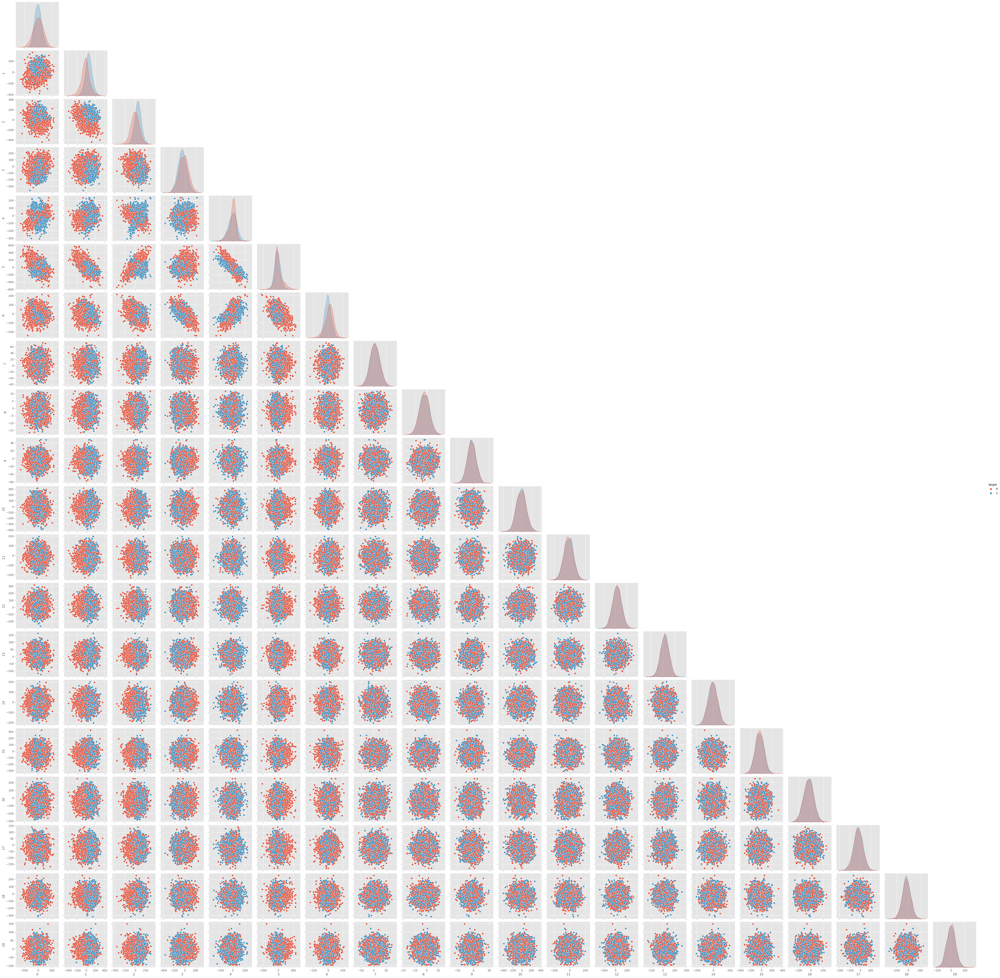

In [6]:
sns.pairplot(train, hue="target", corner=True)
plt.show()

Не смотря на то, что графики очень мелкие, можно заметить следующие особенности:
- признаки 7-19 не являются информативными, а распределение целевого признака в них хаотичное;
- признаки 0-6 наибеолее информативные, так как целевой признак в них занимает определенную область;
- у признака 5 просматривается очень сильная корреляция с признаком 4, а также с 0, 1 и 2.
- у признака 6 есть корреляция с признаками 3, 4 и 5.

Построим матрицу корреляции Phik, которая, в отличае от корреляции Пирсона, чувствительна к нелинейным зависимостям.
Выведем матрицу в виде хитмэпа.

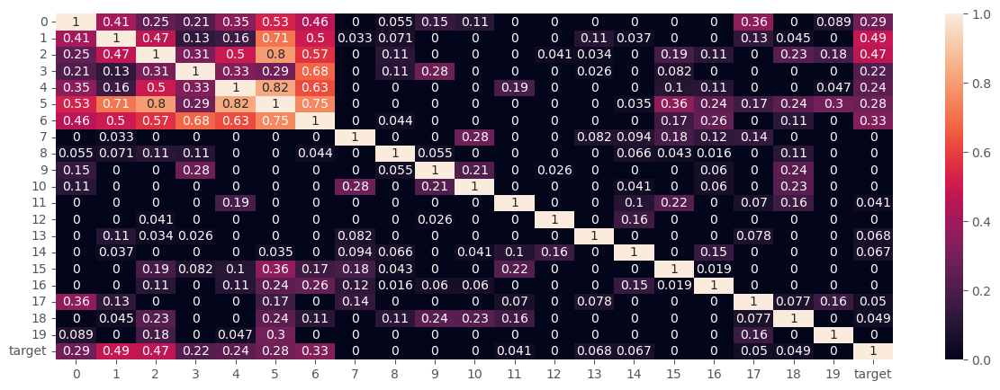

In [7]:
phik_corr = train.phik_matrix(bins=30, verbose=False)

plt.figure(figsize=(15, 5))
sns.heatmap(phik_corr, annot=True)
plt.show()

Значения коэффициентов корреляции подтверждают сделанные выше выводы.

Проверим полученные выводы при помощи построения кривой WoE.

## Построение WoE

В соответствии с заданием №1 определим функцию woe_line, которая делит наблюдения на группы по $X$, для каждой группы считает WoE, и откладывает эти значения на графике.
Дополнительно функция отображает $R^2$ — меру линейности зависимости, а также линию, показывающую линейное приближение.

Полученные графики позволят проверить линейность зависимости, силу переменной, опционально проверить распределение

In [8]:
def woe_line(X, n_buckets, var_nm, ax):
    """
    Функция корректно работает только при определении внешнего plt.subplots
    и передачи соответствующего номера subplot'a в переменную *ax*.

    X: feature number
    n_buckets: number of buckets to plot
    var_nm: optional, var_name to show above the plot
    ax: a plot number in subplots
    """

    # Объединим X и y в датафрейм
    data = train[y].copy()
    data["feature"] = X
    data["bucket"] = pd.qcut(X, n_buckets, duplicates="drop")

    # Количество 0 во всей выборке
    y_0_cnt = (data[y] == 0).sum()[0]
    # Количество 1 во всей выборке
    y_1_cnt = (data[y] == 1).sum()[0]

    # Зададим функции для агрегирования
    def woe_calc(y):
        """Функция расчета WoE"""
        return np.log(sum(y == 1) / sum(y == 0)) - np.log(y_1_cnt / y_0_cnt)

    def bad_rate_calc(y):
        """Функция расчета bad_rate"""
        return sum(y == 1) / len(y)

    def iv_calc(y):
        """Функция расчета IV на бакете"""
        woe = np.log(sum(y == 1) / sum(y == 0)) - np.log(y_1_cnt / y_0_cnt)
        return sum(y == 1) / y_1_cnt - sum(y == 0) / y_0_cnt * woe

    # Агрегирование и расчет функций
    result = data.groupby(by="bucket").agg(
        {"feature": ["median", "count"], y[0]: [woe_calc, bad_rate_calc, iv_calc]}
    )
    result.columns = ["X_med", "X_count", "woe", "bad_rate", "iv"]

    # Расчет ROC AUC на одном признаке
    model = LogisticRegression()
    model.fit(data[["feature"]], data[y[0]])
    roc_auc = roc_auc_score(data[y], model.predict(data[["feature"]]))

    # Расчитываем коэффициенты линейной интерполяции
    a, b = np.polyfit(result["X_med"], result["woe"], 1)
    result["lin_interp"] = [a * x + b for x in result["X_med"]]

    # R2
    r2 = r2_score(result["woe"], result["lin_interp"])

    # Information value
    iv_sum = result["iv"].sum()

    # Определяем доверительный интервал
    confidence_interval = stats.t.interval(
        0.95,
        len(result) - 1,
        loc=result["bad_rate"].mean(),
        scale=result["bad_rate"].std(),
    )

    # Строим графики
    ax.errorbar(result["X_med"], result["woe"], yerr=result["bad_rate"], label="WoE")
    ax.plot(
        result["X_med"],
        result["lin_interp"],
        linestyle="--",
        label="Линейное приближение",
    )

    ax.set_title(
        f"""Признак {var_nm}
        ROC AUC = {np.round(roc_auc, 2)}; ДИ для bad rate = {np.round(confidence_interval, 2)};
        R2 = {np.round(r2, 4)}; Information value = {np.round(iv_sum, 2)}""",
        fontsize=15,
    )
    ax.set_xlabel("Медианное значение признака")
    ax.set_ylabel("Weights of Evidence")
    ax.legend()

    return result

В соответствии с заданием №2 построим WoE для каждой переменной.

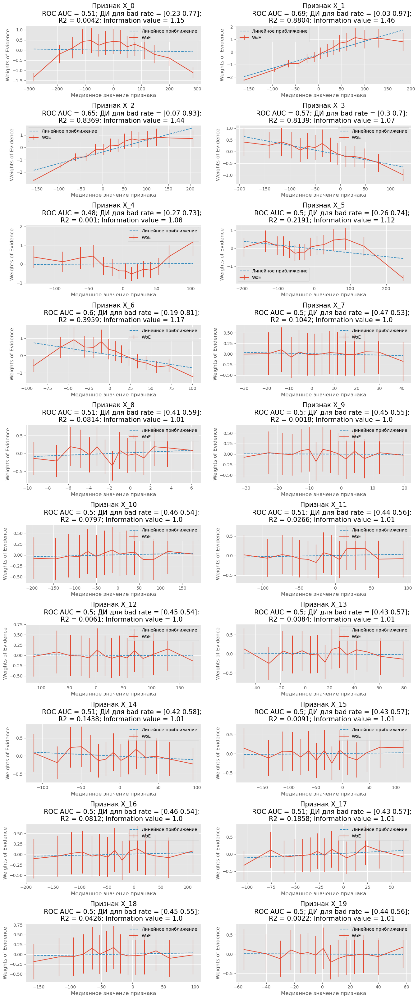

In [9]:
_, axs = plt.subplots(int(n_features / 2), 2, figsize=(16, 40))
plt.subplots_adjust(hspace=0.7)

for i in range(int(n_features / 2)):
    for j in range(2):
        woe_line(
            train[X[i * 2 + j]],
            n_buckets=15,
            var_nm=f"X_{i * 2 + j}",
            ax=axs[i, j],
        )

Полученные графики подтверждают сделанные ранее предположения о значимости признаков 0-6 и его отсутсвии для признаков 7-19.

## Feature engineering

В соответствии с заданием №2 преобразуем признаки для повышения их ROC AUC и линейности WoE.
Для этого над ними выполнены следующие операции:
- взятие модуля числа;
- логарифмирование абсолютного значения;
- взятие корня абсолютного значения;
- взятие тригонометрических функций (sin, arcsin, tan, arctan);
- возведение в степень, в том числе отрицательную.

К положительному эффекту для признаков 0 и 4 привело взятие модуля.
Для остальных признаков и преобразований положительный эффект отсутствует.
В то же время, действенным оказалось ограничение значений признаков до уровня некоторых значений, полученных эмперически.

Визуализируем преобразования для признаков 0-6.

In [10]:
def feature_filter(i, clip_min, clip_max, function=None):
    """
    Функция строит графки WoE одного признака и его модификацию
    при ограничении значений и применении функции преобразования.

    i: номер признака,
    clip_min: ограничение значений снизу,
    clip_max: ограничение значений сверху,
    function: функция преобразования.
    """
    _, axs = plt.subplots(1, 2, figsize=(16, 4))
    plt.subplots_adjust(hspace=0.7)

    woe_line(
        train[X[i]],
        n_buckets=15,
        var_nm=f"X_{i}",
        ax=axs[0],
    )

    if function:
        X_mod = function(train[X[i]])
    else:
        X_mod = train[X[i]]

    woe_line(
        np.clip(X_mod, clip_min, clip_max),
        n_buckets=15,
        var_nm=f"X_{i}",
        ax=axs[1],
    )
    plt.show()

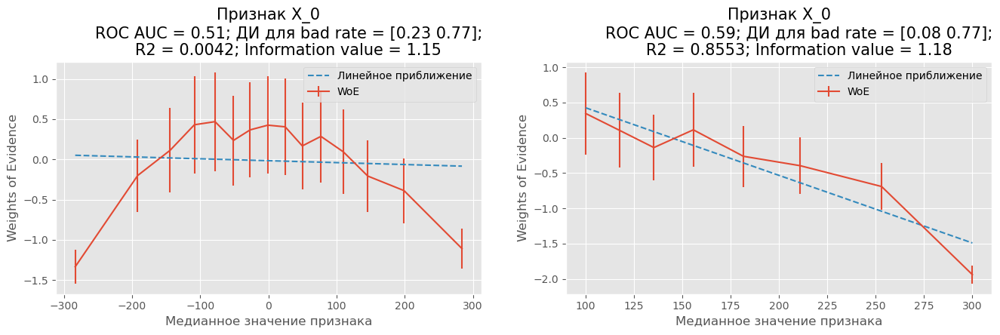

In [11]:
feature_filter(0, 100, 300, np.abs)

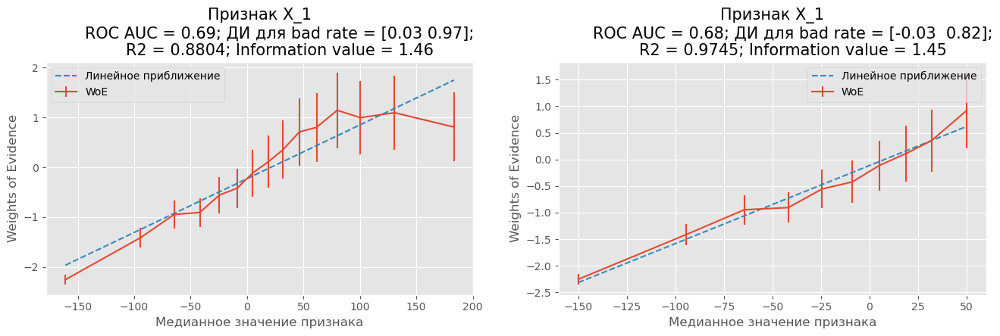

In [12]:
feature_filter(1, -150, 50, None)

Видно, что переменная разделяет целевую переменную примерно до значения 50, дальше кривая выходит на "плато". 
Этот хвост ограничен, чтобы не закладывать разделение в модель.

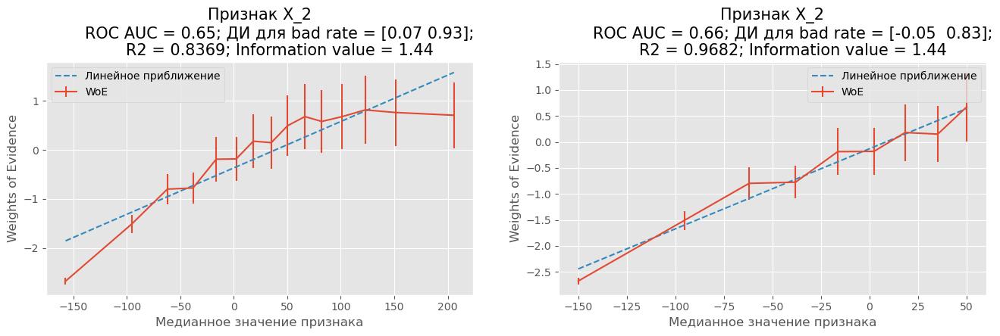

In [13]:
feature_filter(2, -150, 50, None)

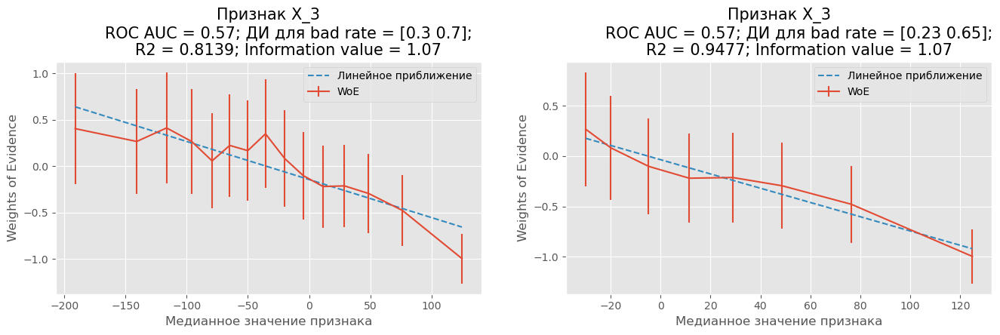

In [14]:
feature_filter(3, -30, 150, None)

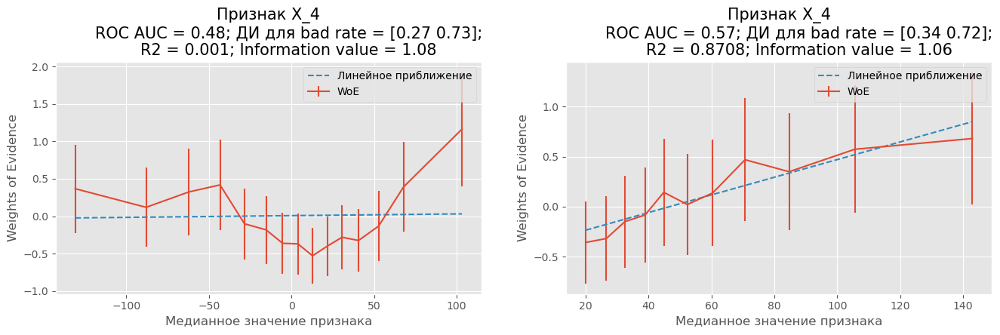

In [15]:
feature_filter(4, 20, 200, np.abs)

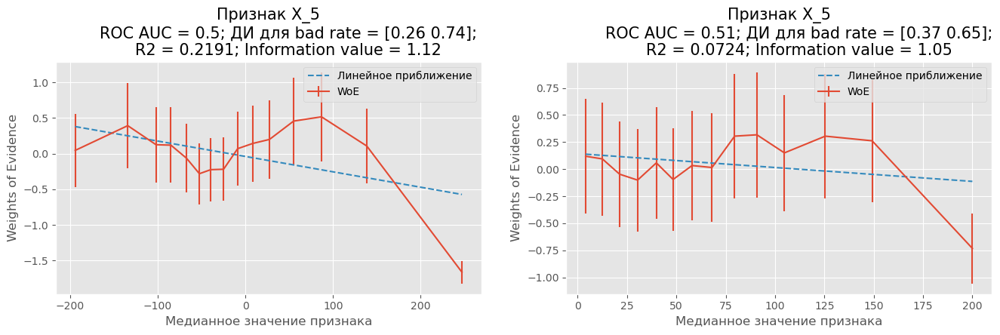

In [16]:
feature_filter(5, -200, 200, np.abs)

Признак 5 не поддается линеаризации.

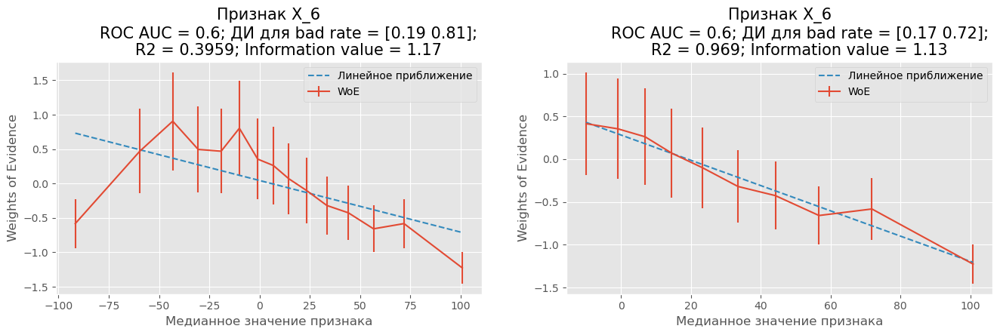

In [17]:
feature_filter(6, -10, 200, None)

Построенные графики позволяют ограничить набор значимых признаков для обучения до следующего: 

In [18]:
X_new = [0, 1, 2, 3, 4]

Сохраним проведенные преобразования в отдельную переменную.
Учитывая, что регуляризации в логистической регрессии сильно зависит от стандартного отклонения признака, проведем стандартизацию признаков.

In [19]:
stsc = StandardScaler()

In [20]:
def feature_processing(df):
    new_array = df[X_new + y].copy()
    new_array[0] = stsc.fit_transform(np.clip(np.abs(new_array[[0]]), 100, 300))
    new_array[1] = stsc.fit_transform(np.clip(new_array[[1]], -150, 50))
    new_array[2] = stsc.fit_transform(np.clip(new_array[[2]], -150, 50))
    new_array[3] = stsc.fit_transform(np.clip(new_array[[3]], -30, 150))
    new_array[4] = stsc.fit_transform(np.clip(np.abs(new_array[[4]]), 20, 200))
    return new_array

In [21]:
train_processed = feature_processing(train)
test_processed = feature_processing(test)

Проверим качество преобразований, построив обновленную матрицу коррелияции.

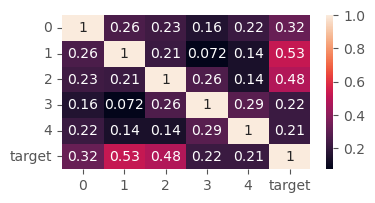

In [22]:
phik_corr_new = train_processed.phik_matrix(bins=30, verbose=False)

plt.figure(figsize=(4, 2))
sns.heatmap(phik_corr_new, annot=True)
plt.show()

Из рисунка видно, что оставшиеся признаки имеют слабую мультиколлинеарность.
В то же время связь с целевым признаком усилилась по сравнению с предыдущим рассмотрением на необработанных признаках.

# Построение логистической регрессии

Проведем обучение логистичческой регрессии на начальном наборе признаков и на обработанном. 
Сравним метрику ROC AUC в обоих случаях при помощи валидационной выборки.
Затем проведем оптимизию гиперпараметров при помощи библиотеки Optuna и кроссвалидации.

In [23]:
train_2, val = train_test_split(train, test_size=0.3, random_state=SEED)

train_2_processed = feature_processing(train_2)
val_processed = feature_processing(val)

model_lr = LogisticRegression(random_state=SEED)
model_lr.fit(train_2[X], train_2[y[0]])
print(
    f"""ROC AUC логистической регрессии на начальном наборе признаков:
    {roc_auc_score(val[y], model_lr.predict(val[X]))}
"""
)
model_lr.fit(train_2_processed[X_new], train_2_processed[y[0]])
print(
    f"""ROC AUC логистической регрессии на обработанном наборе признаков:
    {roc_auc_score(val_processed[y], model_lr.predict(val_processed[X_new]))}
"""
)

ROC AUC логистической регрессии на начальном наборе признаков:
    0.742

ROC AUC логистической регрессии на обработанном наборе признаков:
    0.7909166666666666



/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [24]:
# Задаем стратификацию
skf = StratifiedKFold(5, shuffle=True, random_state=SEED)

In [25]:
def optuna_lr_cvs(X, y, n_trials):
    def objective_lr(trial):
        params = {
            "penalty": trial.suggest_categorical("penalty", ["l1", "l2", "elasticnet"]),
            "class_weight": trial.suggest_categorical(
                "class_weight", ["balanced", None]
            ),
            "max_iter": trial.suggest_int("max_iter", 100, 3000, 50),
            "random_state": SEED,
        }

        if params["penalty"] == "l2":
            params["solver"] = trial.suggest_categorical(
                "solver", ["newton-cg", "lbfgs", "liblinear", "sag", "saga"]
            )
            if params["solver"] == "liblinear":
                params["dual"] = trial.suggest_categorical("dual", [True, False])

        if params["penalty"] == "elasticnet":
            params["l1_ratio"] = trial.suggest_float("l1_ratio", 0, 1)
            params["solver"] = "saga"

        if params["penalty"] == "l1":
            params["solver"] = "liblinear"

        model_lr = LogisticRegression(**params)

        return cross_val_score(model_lr, X, y, scoring="roc_auc", cv=skf).min()

    study_lr = optuna.create_study(
        direction="maximize",
        sampler=optuna.samplers.TPESampler(seed=SEED),
    )
    study_lr.optimize(objective_lr, n_trials=n_trials, show_progress_bar=True)

    return study_lr

In [26]:
best_lr_full = optuna_lr_cvs(train[X], train[y[0]], 20)
best_lr_processed = optuna_lr_cvs(train_processed[X_new], train_processed[y[0]], 20)

[I 2023-05-30 22:05:24,781] A new study created in memory with name: no-name-82594fd8-34de-4278-87bf-19685a5b919b
/home/deli/anaconda3/lib/python3.9/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/20 [00:00<?, ?it/s]

/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:05:31,325] Trial 0 finished with value: 0.8077959508369464 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 650, 'l1_ratio': 0.26950524561691824}. Best is trial 0 with value: 0.8077959508369464.
[I 2023-05-30 22:05:35,444] Trial 1 finished with value: 0.8077209817616899 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 900, 'solver': 'sag'}. Best is trial 0 with value: 0.8077959508369464.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:05:40,399] Trial 2 finished with value: 0.8078292704259492 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 500, 'l1_ratio': 0.9753416365737264}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:05:40,692] Trial 3 finished with value: 0.8076959920699378 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 1950, 'solver': 'newton-cg'}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:05:49,877] Trial 4 finished with value: 0.8077876209396958 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 2600, 'l1_ratio': 0.09671889716483129}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:05:50,166] Trial 5 finished with value: 0.8076834972240619 and parameters: {'penalty': 'l2', 'class_weight': 'balanced', 'max_iter': 2700, 'solver': 'newton-cg'}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:05:50,279] Trial 6 finished with value: 0.8076376827891

/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[I 2023-05-30 22:05:56,510] Trial 7 finished with value: 0.6767125227510319 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 1650, 'solver': 'liblinear', 'dual': True}. Best is trial 2 with value: 0.8078292704259492.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[I 2023-05-30 22:06:03,856] Trial 8 finished with value: 0.7249134731923083 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 1950, 'solver': 'liblinear', 'dual': True}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:06:12,897] Trial 9 finished with value: 0.807791785888321 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 950, 'l1_ratio': 0.6122445088199662}. Best is trial 2 with value: 0.8078292704259492.
[I 2023-05-30 22:06:13,007] Trial 10 finished with value: 0.8076376827891829 and parameters: {'penalty': 'l1', 'class_weight': 'balanced', 'max_iter': 200}. Best is trial 2 with value: 0.8078292704259492.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:06:14,076] Trial 11 finished with value: 0.8063173940749441 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 100, 'l1_ratio': 0.9515602664635807}. Best is trial 2 with value: 0.8078292704259492.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:06:21,804] Trial 12 finished with value: 0.8078542601177015 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 750, 'l1_ratio': 0.9785926872789781}. Best is trial 12 with value: 0.8078542601177015.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:06:27,731] Trial 13 finished with value: 0.8078459302204507 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 550, 'l1_ratio': 0.9957384209564187}. Best is trial 12 with value: 0.8078542601177015.
[I 2023-05-30 22:06:37,113] Trial 14 finished with value: 0.8077751260938196 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 1200, 'l1_ratio': 0.9900626866851793}. Best is trial 12 with value: 0.8078542601177015.
[I 2023-05-30 22:06:46,016] Trial 15 finished with value: 0.8077751260938196 and parameters: {'penalty': 'elasticnet', 'class_weight': 'balanced', 'max_iter': 1200, 'l1_ratio': 0.7496043843465463}. Best is trial 12 with value: 0.8078542601177015.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:06:51,074] Trial 16 finished with value: 0.8078126106314478 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 500, 'l1_ratio': 0.746057953508279}. Best is trial 12 with value: 0.8078542601177015.
[I 2023-05-30 22:06:51,187] Trial 17 finished with value: 0.8076460126864335 and parameters: {'penalty': 'l1', 'class_weight': None, 'max_iter': 1150}. Best is trial 12 with value: 0.8078542601177015.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[I 2023-05-30 22:06:57,697] Trial 18 finished with value: 0.8077959508369464 and parameters: {'penalty': 'elasticnet', 'class_weight': 'balanced', 'max_iter': 650, 'l1_ratio': 0.7909465628162867}. Best is trial 12 with value: 0.8078542601177015.


/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/deli/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
[I 2023-05-30 22:07:01,257] A new study created in memory with name: no-name-457

[I 2023-05-30 22:07:01,252] Trial 19 finished with value: 0.8078625900149521 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 350, 'l1_ratio': 0.4932998634074092}. Best is trial 19 with value: 0.8078625900149521.


/home/deli/anaconda3/lib/python3.9/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2023-05-30 22:07:01,369] Trial 0 finished with value: 0.8505783031166311 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 650, 'l1_ratio': 0.26950524561691824}. Best is trial 0 with value: 0.8505783031166311.
[I 2023-05-30 22:07:01,481] Trial 1 finished with value: 0.850565808270755 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 900, 'solver': 'sag'}. Best is trial 0 with value: 0.8505783031166311.
[I 2023-05-30 22:07:01,577] Trial 2 finished with value: 0.8505574783735043 and parameters: {'penalty': 'elasticnet', 'class_weight': None, 'max_iter': 500, 'l1_ratio': 0.9753416365737264}. Best is trial 0 with value: 0.8505783031166311.
[I 2023-05-30 22:07:01,674] Trial 3 finished with value: 0.8505783031166311 and parameters: {'penalty': 'l2', 'class_weight': None, 'max_iter': 1950, 'solver': 'newton-cg'}. Best is trial 0 with value: 0.8505783031166311.
[I 2023-05-30 22:07:01,773] Trial 4 finished with value: 0.8505783031166312 and paramet

In [27]:
print(
    f"""Лучшее значение ROC AUC логистической регрессии с начальными признаками: 
    {np.round(best_lr_full.best_value, 2)}"""
)
print(
    f"""Лучшее значение ROC AUC логистической регрессии с обработанными признаками: 
    {np.round(best_lr_processed.best_value, 2)}"""
)

Лучшее значение ROC AUC логистической регрессии с начальными признаками: 
    0.81
Лучшее значение ROC AUC логистической регрессии с обработанными признаками: 
    0.85


По полученным значениям очевидно, что для логистической регрессии критически важно производить отбор и обработку признаков.

Проверим эффективность выбранных гиперпараметров при обучении на полном трейне с проверкой на тестовой выборке.

In [28]:
model_lr_best = LogisticRegression(
    **best_lr_processed.best_params, solver="saga", random_state=SEED
)
model_lr_best.fit(train_processed[X_new], train_processed[y[0]])
roc_auc_score(test[y], model_lr_best.predict(test_processed[X_new]))

0.7900454967637071

Представленное значение меньше полученного на кроссвалидации, что может говорить о переобучении модели.

# Построение случайного леса

В соответствии с заданием №3 рассмотрим модель случайного леса.

In [29]:
model_rf = RandomForestClassifier(random_state=SEED)
model_rf.fit(train_2[X_new], train_2[y[0]])
print(
    f"""ROC AUC леса на начальном наборе признаков:
    {roc_auc_score(val[y], model_rf.predict(val[X_new]))}
"""
)
model_rf.fit(train_2_processed[X_new], train_2_processed[y[0]])
print(
    f"""ROC AUC леса на обработанном наборе признаков:
    {roc_auc_score(val_processed[y], model_rf.predict(val_processed[X_new]))}
"""
)

ROC AUC леса на начальном наборе признаков:
    0.8600277777777777

ROC AUC леса на обработанном наборе признаков:
    0.7968611111111111



Представленные значения при обучении на обработанном наборе признаков практически равно аналогичному, полученному при помощи линейной регрессии.
В то же время, для начального набора вывод противоположный.
Такой результат может говорить о том, что в ходе обработки признаков была потеряна часть значимой информации, которая успешно обработана случайным лесом.

In [30]:
def optuna_rf_cvs(X, y, n_trials):
    def objective_rf(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 50, 1000, 50),
            "max_depth": trial.suggest_int("max_depth", 1000, 3000, 100),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 2000),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 2000),
            "max_features": trial.suggest_categorical(
                "max_features", ["sqrt", "log2", None]
            ),
            "max_leaf_nodes": trial.suggest_int("max_leaf_nodes", 100, 5000, 100),
            "random_state": SEED,
        }

        model_rf = RandomForestClassifier(**params)

        return cross_val_score(model_rf, X, y, scoring="roc_auc", cv=skf).min()

    study_rf = optuna.create_study(
        direction="maximize",
        sampler=optuna.samplers.TPESampler(seed=SEED),
    )

    study_rf.enqueue_trial(
        {
            "n_estimators": 100,
            "max_depth": 1000,
            "min_samples_split": 2,
            "min_samples_leaf": 1,
            "max_features": "sqrt",
            "max_leaf_nodes": 2000,
        }
    )

    study_rf.optimize(objective_rf, n_trials=n_trials, show_progress_bar=True)

    return study_rf

In [31]:
best_rf_full = optuna_rf_cvs(train[X], train[y[0]], 100)
best_rf_processed = optuna_rf_cvs(train_processed[X_new], train_processed[y[0]], 100)

[I 2023-05-30 22:07:04,933] A new study created in memory with name: no-name-7a454392-2d91-4115-922c-c3a03669ad3a
/home/deli/anaconda3/lib/python3.9/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2023-05-30 22:07:12,758] Trial 0 finished with value: 0.920441151358398 and parameters: {'n_estimators': 100, 'max_depth': 1000, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_leaf_nodes': 2000}. Best is trial 0 with value: 0.920441151358398.
[I 2023-05-30 22:07:15,916] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 350, 'max_depth': 2000, 'min_samples_split': 1537, 'min_samples_leaf': 1579, 'max_features': 'sqrt', 'max_leaf_nodes': 2500}. Best is trial 0 with value: 0.920441151358398.
[I 2023-05-30 22:07:27,015] Trial 2 finished with value: 0.7804447332142159 and parameters: {'n_estimators': 750, 'max_depth': 1400, 'min_samples_split': 361, 'min_samples_leaf': 1078, 'max_features': 'log2', 'max_leaf_nodes': 1500}. Best is trial 0 with value: 0.920441151358398.
[I 2023-05-30 22:08:04,169] Trial 3 finished with value: 0.7050832986255727 and parameters: {'n_estimators': 1000, 'max_depth': 2900, 'min_samples_split': 1137, 'min_samples_lea

[I 2023-05-30 22:27:03,399] A new study created in memory with name: no-name-d96f40e5-b26f-436d-a102-7d711295f829


[I 2023-05-30 22:27:03,395] Trial 99 finished with value: 0.8799786754630381 and parameters: {'n_estimators': 50, 'max_depth': 2000, 'min_samples_split': 228, 'min_samples_leaf': 60, 'max_features': 'log2', 'max_leaf_nodes': 2100}. Best is trial 0 with value: 0.920441151358398.


/home/deli/anaconda3/lib/python3.9/site-packages/optuna/progress_bar.py:56: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2023-05-30 22:27:06,578] Trial 0 finished with value: 0.8694684276069454 and parameters: {'n_estimators': 100, 'max_depth': 1000, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_leaf_nodes': 2000}. Best is trial 0 with value: 0.8694684276069454.
[I 2023-05-30 22:27:09,749] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 350, 'max_depth': 2000, 'min_samples_split': 1537, 'min_samples_leaf': 1579, 'max_features': 'sqrt', 'max_leaf_nodes': 2500}. Best is trial 0 with value: 0.8694684276069454.
[I 2023-05-30 22:27:18,066] Trial 2 finished with value: 0.7881373933252533 and parameters: {'n_estimators': 750, 'max_depth': 1400, 'min_samples_split': 361, 'min_samples_leaf': 1078, 'max_features': 'log2', 'max_leaf_nodes': 1500}. Best is trial 0 with value: 0.8694684276069454.
[I 2023-05-30 22:27:31,568] Trial 3 finished with value: 0.7050832986255727 and parameters: {'n_estimators': 1000, 'max_depth': 2900, 'min_samples_split': 1137, 'min_samples

In [32]:
print(
    f"Лучшее значение ROC AUC Леса с начальными признаками: {np.round(best_rf_full.best_value, 2)}"
)
print(
    f"Лучшее значение ROC AUC Леса с обработанными признаками: {np.round(best_rf_processed.best_value, 2)}"
)

Лучшее значение ROC AUC Леса с начальными признаками: 0.92
Лучшее значение ROC AUC Леса с обработанными признаками: 0.88


Полученное значение для модели с обработанными признаками меньше аналогичного на полном наборе признаков на 4 п.п. и только на 3 п.п. лучше полученного на регрессии.
Таким образом подтверждается выввод о том, что в ходе обработки была потерена часть значимой информации.

Проведем обучение леса на полном наборе данных и проверку на тестовой выборке.

In [33]:
model_rf_best = RandomForestClassifier(**best_rf_full.best_params, random_state=SEED)
model_rf_best.fit(train[X], train[y[0]])
roc_auc_score(test[y], model_rf_best.predict(test[X]))

0.8599940498650335

Итоговое значение метрики лучше аналогичного для регрессия на 6 п.п.
В этой связи делаем вывод, что "деревянные модели" в настоящей задаче дают лучшее решение по метрике ROC AUC.

# Заключение

На сгенерированных данных рассмотрены базовые инструменты построения логистической регрессии и случайного леса.
Выполнены визуализация данных, их анализ с точки зрения значимости на конечное решение и отбор признаков.
Проведена оптимизация гиперпараметров моделей при помощи инструмента Optuna с использованием метода кросс-валидации.

В резльтате получено, что для регрессионной модели обработка и оптимизация используемых признаков вносит существенный вклад в качество ее метрик.
В то же время модель случайного леса оказывается более устойчива к качеству самих признаков и дает лучший результат на их необработанных значениях. 